In [18]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# !export PYDEVD_WARN_SLOW_RESOLVE_TIMEOUT=2

### Load packages and data

In [3]:
import spatialdata_io
import matplotlib.pyplot as plt
import spatialdata as sd
import segtraq
import spatialdata_plot
import scanpy as sc
import seaborn as sns
import anndata as ad
import matplotlib.patches as patches
import numpy as np
import pandas as pd
import dask.dataframe as dd
import glob
from dask import delayed

from spatialdata.models import PointsModel
import statsmodels.api as sm
from pathlib import Path
from spatialdata.transformations import (
    get_transformation,
    set_transformation,
)

/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
sdata = sd.read_zarr("/g/huber/projects/CODEX/segtraq/data/20260204_SegTraQ_sdata/xenium_v1_data/sdata_xenium_crop.zarr/")


In [5]:
st = segtraq.SegTraQ(
    sdata,
    tables_centroid_x_key=None,
    tables_centroid_y_key=None,
    points_background_id=-1,  # "UNASSIGNED" for Xenium prime
)

/g/huber/users/lazic/src/SegTraQ/src/segtraq/SegTraQ.py:116: RuntimeWarning: No centroids specified for tables. Centroids will be automatically computed from shapes.
  validate_spatialdata(


## Compute baseline metrics

In [6]:
%%time
st.run_baseline()

CPU times: user 1.38 s, sys: 243 ms, total: 1.63 s
Wall time: 1.65 s


## Raw cosine similarity

In [7]:
%%time
# recompute region similarity
st.rs.similarity_border_neighborhood()

CPU times: user 1min 27s, sys: 423 ms, total: 1min 27s
Wall time: 1min 28s


,cell_id,similarity_center_border,similarity_border_neighborhood,ratio_border_neighborhood_to_center
0,6327,0.527484,0.599392,1.136323
1,6328,0.505440,0.491721,0.972858
2,6330,0.448379,0.509950,1.137320
3,6331,0.538128,0.620968,1.153941
4,6332,0.549761,0.586564,1.066943
...,...,...,...,...
1557,95953,0.498089,0.531000,1.066074
1558,95954,0.255608,0.404242,1.581491
1559,95955,0.390033,0.393295,1.008362
1560,95959,0.412926,0.345856,0.837574


In [8]:
features = ['similarity_center_border', 'similarity_border_neighborhood', 'ratio_border_neighborhood_to_center', 'transcript_count']
cell_df = []
obs = sdata.tables['table'].obs[features].copy()
obs['sample'] = "proseg2"
cell_df.append(obs)
cell_df = pd.concat(cell_df)
print(cell_df.shape)
cell_df = cell_df.reset_index(drop=True)
cell_df.head()

(1563, 5)


,similarity_center_border,similarity_border_neighborhood,ratio_border_neighborhood_to_center,transcript_count,sample
0,0.527484,0.599392,1.136323,420.0,proseg2
1,0.505440,0.491721,0.972858,201.0,proseg2
2,0.448379,0.509950,1.137320,391.0,proseg2
3,0.538128,0.620968,1.153941,512.0,proseg2
4,0.549761,0.586564,1.066943,345.0,proseg2


In [9]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

def plot_rs_against_counts(cell_df, xcol, ycols):
    plot_df = cell_df.replace([np.inf, -np.inf], np.nan).dropna(subset=[xcol] + ycols)
    plot_df = plot_df[plot_df[xcol] >= 0]

    n_cols = min(3, len(ycols))
    n_rows = int(np.ceil(len(ycols) / n_cols))

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(4 * n_cols, 3 * n_rows),
        sharex=False,
        sharey=False
    )

    # make axes always 2D
    axes = np.atleast_2d(axes)

    for j, ycol in enumerate(ycols):
        i, k = divmod(j, n_cols)
        ax = axes[i, k]

        sns.scatterplot(
            data=plot_df,
            x=xcol,
            y=ycol,
            alpha=0.25,
            s=10,
            linewidth=0,
            ax=ax,
            color="black"
        )

        X = sm.add_constant(plot_df[xcol].to_numpy())
        y = plot_df[ycol].to_numpy()

        if len(X) > 1:
            model = sm.OLS(y, X, missing="drop").fit()
            r2 = model.rsquared

            xs = np.linspace(plot_df[xcol].min(), plot_df[xcol].max(), 200)
            ys = model.predict(sm.add_constant(xs))

            ax.plot(xs, ys, color="red")
            title = f"{ycol}\n$R^2$={r2:.3f}"
        else:
            title = ycol

        ax.set_title(title)

        if i == n_rows - 1:
            ax.set_xlabel(xcol)
        else:
            ax.set_xlabel("")

    # hide unused axes
    total_axes = n_rows * n_cols
    for j in range(len(ycols), total_axes):
        i, k = divmod(j, n_cols)
        axes[i, k].set_visible(False)

    plt.tight_layout()
    plt.show()

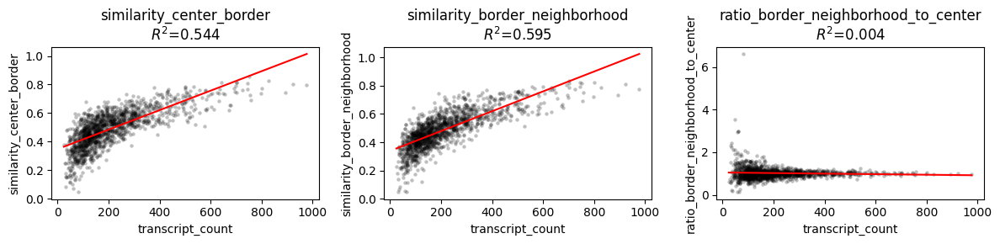

In [10]:
plot_rs_against_counts(cell_df, "transcript_count",
                       ycols=[
                        "similarity_center_border",
                        "similarity_border_neighborhood",
                        "ratio_border_neighborhood_to_center",
                    ])

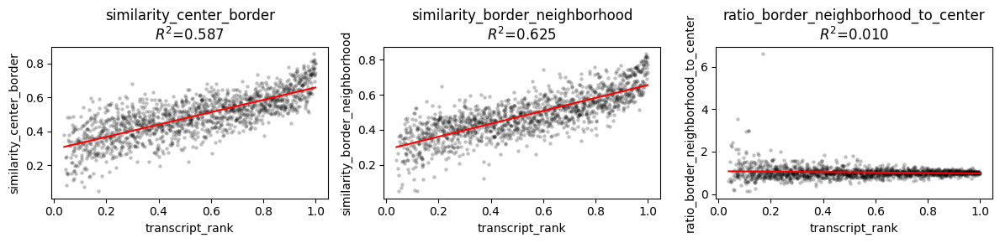

In [11]:
cell_df["transcript_rank"] = cell_df["transcript_count"].rank(pct=True)
plot_rs_against_counts(cell_df, "transcript_rank",
                        ycols=[
                        "similarity_center_border",
                        "similarity_border_neighborhood",
                        "ratio_border_neighborhood_to_center",
                    ])

## Chi2 center border similarity
The chi-square test is an approximate test: it compares the observed counts to the counts you would expect if center and border had the same composition, and then asks whether the overall deviation is larger than would usually happen by chance. Those expected counts are calculated from the row totals and column totals of the table, so they represent the pattern you would see if counts were distributed proportionally under the null hypothesis. The expected distribution is simply the most neutral allocation that preserves total per-region and per-gene counts. Chi-square does not measure only “how different” two distributions are — it measures how different they are relative to the amount of sampling noise expected at that count depth. If you keep the same compositional difference but multiply all counts by a constant, the chi-square statistic also grows roughly by that constant.


In [12]:
st.rs.chi2_center_border_similarity()

,chi2_center_border_stat,chi2_center_border_pvalue,chi2_center_border_dof,chi2_center_border_cramers_v,center_counts_used,border_counts_used,n_genes_used,cell_id
0,151.568332,0.002999,107.0,0.605800,288,125,108,6327
1,84.823342,0.253483,77.0,0.656182,125,72,78,6328
2,145.907135,0.007417,107.0,0.621287,271,107,108,6330
3,200.356248,0.000073,130.0,0.635566,344,152,131,6331
4,120.393412,0.029554,93.0,0.598593,227,109,94,6332
...,...,...,...,...,...,...,...,...
1557,94.855709,0.070560,76.0,0.614745,137,114,77,95953
1558,56.174968,0.144631,46.0,0.859735,58,18,47,95954
1559,46.243204,0.168529,38.0,0.729062,63,24,39,95955
1560,34.742857,0.480449,35.0,0.736788,49,15,36,95959


In [13]:
features = (['chi2_center_border_stat',     #raw chi-square statistic
             'chi2_center_border_pvalue',   #almost always significant for high counts
             'chi2_center_border_dof',      #degrees of freedom - reflect how many genes were included in the comparison
             'chi2_center_border_cramers_v',# effect size measure that is normalized for the number of genes included in the comparison - should be less dependent on total counts
             'transcript_count'])

cell_df = []
obs = sdata.tables['table'].obs[features].copy()
obs['sample'] = "xenium"
cell_df.append(obs)
cell_df = pd.concat(cell_df)
print(cell_df.shape)
cell_df = cell_df.reset_index(drop=True)
cell_df.head()

(1563, 6)


,chi2_center_border_stat,chi2_center_border_pvalue,chi2_center_border_dof,chi2_center_border_cramers_v,transcript_count,sample
0,151.568332,0.002999,107.0,0.605800,420.0,xenium
1,84.823342,0.253483,77.0,0.656182,201.0,xenium
2,145.907135,0.007417,107.0,0.621287,391.0,xenium
3,200.356248,0.000073,130.0,0.635566,512.0,xenium
4,120.393412,0.029554,93.0,0.598593,345.0,xenium


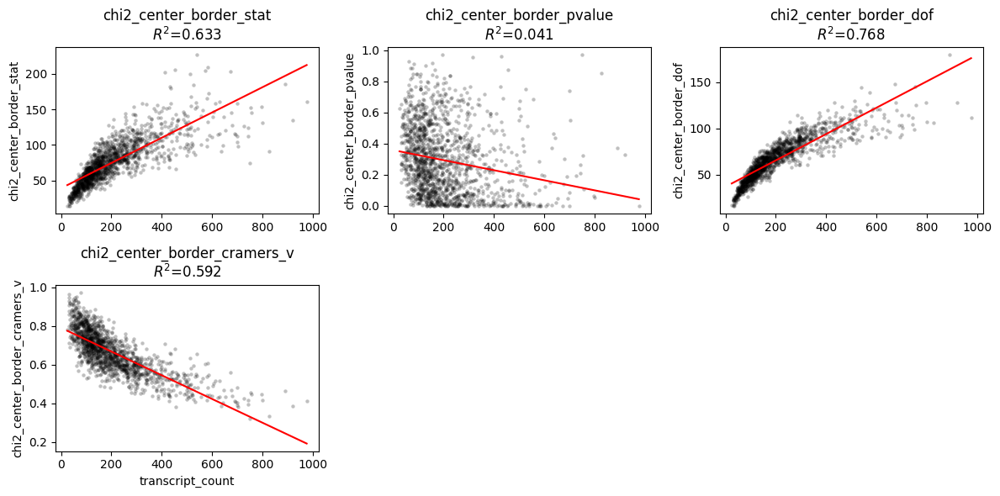

In [14]:
plt.style.use("default")
plot_rs_against_counts(cell_df, "transcript_count",
                       ycols=[
                        'chi2_center_border_stat', 
                        'chi2_center_border_pvalue', 
                        'chi2_center_border_dof', 
                        'chi2_center_border_cramers_v',
                    ])

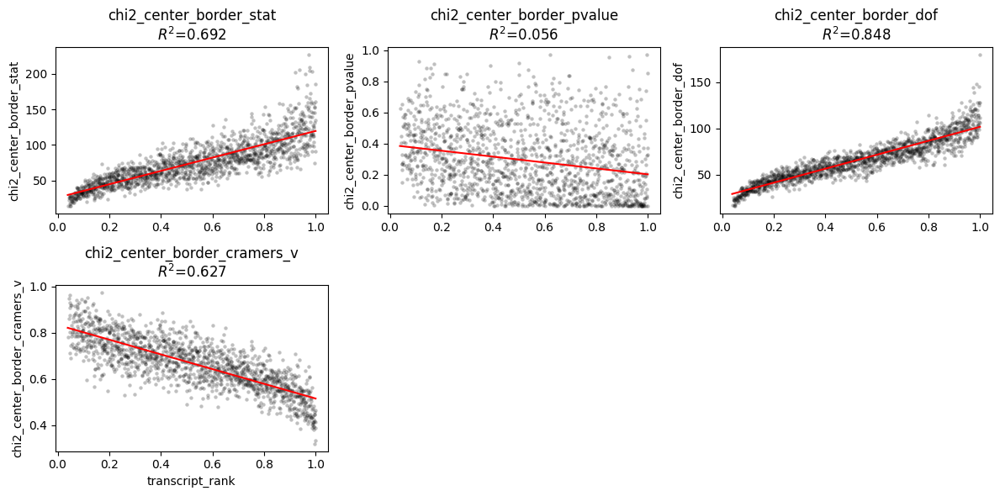

In [15]:
cell_df["transcript_rank"] = cell_df["transcript_count"].rank(pct=True)
plot_rs_against_counts(cell_df, "transcript_rank",
                       ycols=[
                        'chi2_center_border_stat', 
                        'chi2_center_border_pvalue', 
                        'chi2_center_border_dof', 
                        'chi2_center_border_cramers_v',
                    ])

In [16]:
sdata.tables['table'].obs["candidate_contaminated_chi2"] = (
    (sdata.tables['table'].obs["chi2_center_border_cramers_v"] > sdata.tables['table'].obs["chi2_center_border_cramers_v"].quantile(0.95)) &
    (sdata.tables['table'].obs["chi2_center_border_pvalue"] < 0.05)
)

## Fisher–exact test (Fisher–Freeman–Halton exact test for a 2×G contingency table)

Fisher’s exact test is an exact conditional test: instead of relying on an approximation, it asks how unusual the observed table is among all possible tables that have the same margins (same fixed counts per regions and per gene). In other words, Fisher treats the total counts in center, border, and each gene as fixed, and evaluates whether the specific allocation you observed is surprisingly extreme. This makes Fisher more reliable when counts are very small or sparse, whereas chi-square is usually faster and more practical for larger tables. So the null-model is very similar to the null-corrected cosine similarity (below). The real difference is the statistic used to judge “extremeness". Fisher cares about the exact count configuration. The difference is that Fisher evaluates whether the exact observed count table is unusually unlikely, whereas your method evaluates whether the observed cosine similarity is unusually high or low under that same null.

A 2×G table is not the ordinary `scipy.stats.fisher_exact`, because that function only handles 2×2 tables.
So the right analogue here is a Fisher–Freeman–Halton exact test for a 2×G contingency table, and in practice the workable way to do it per cell is with a Monte Carlo conditional test under the same fixed-margins null. 
We 
- build the 2×G center/border table
- condition on the row totals and column totals
- compute the multivariate hypergeometric probability of the observed table
- sample many null tables with the same margins
- return a Monte Carlo Fisher-style p-value based on how many sampled tables are at least as unlikely as the observed one

Two cautions matter here. First, for RxC exact tests, “two-sided” is not uniquely defined the way it is for 2×2 Fisher, so the rule used above is the common Monte Carlo choice: count sampled tables with probability less than or equal to the observed table.

In [ ]:
st.rs.fisher_center_border_similarity()

In [ ]:
features = (['fisher_center_border_logprob',    
             'fisher_center_border_pvalue',   
             'transcript_count'])

cell_df = []
obs = sdata.tables['table'].obs[features].copy()
obs['sample'] = "xenium"
cell_df.append(obs)
cell_df = pd.concat(cell_df)
print(cell_df.shape)
cell_df = cell_df.reset_index(drop=True)
cell_df.head()

Computation was stopped after 10min - not scalable.

Fisher usually gives an odds ratio in the 2×2 case, but for our 2×G center-vs-border gene table, there is no single natural odds ratio for the whole table, only a p-value for whether the overall allocation is unusually unlikely.

## Mixture-fit score

This metric quantifies whether the **border expression profile** of a cell can be explained as a mixture of its own **center** and the **local neighborhood**.

#### Overview
For each cell, the method:

1. **Computes three expression profiles**
   - **center**: transcripts in the eroded interior of the cell
   - **border**: transcripts in the outer ring of the cell
   - **neighborhood**: aggregated expression of nearby cells within a specified radius

2. **Restricts to a shared gene space**
   - Only genes detected in at least one of the three regions are retained.
   - Cells with too few transcripts or too few genes are excluded.

3. **Converts counts to normalized proportions**
   - Raw counts are transformed into gene-expression proportions (optionally with pseudocount smoothing),
     so the model focuses on **composition** rather than absolute transcript count.

4. **Fits a center–neighborhood mixture model**
   - The border profile is modeled as:
     
     $$
     p_{\mathrm{border}} = (1-\alpha)\, p_{\mathrm{center}} + \alpha\, p_{\mathrm{neighborhood}}
     $$
     
   - The parameter **\(\alpha\)** is estimated by least squares and interpreted as the fraction of the border profile that is neighborhood-like.

5. **Quantifies how well the mixture explains the border**
   - The method compares:
     - a **center-only model** (border ≈ center)
     - the **best-fitting mixture model** (border ≈ center + neighborhood)
   - It reports the improvement in fit when neighborhood contribution is allowed.

#### Main outputs
- **`mixture_alpha_hat`**  
  Estimated contamination fraction. Higher values indicate the border is more similar to the neighborhood.

- **`mixture_fit_improvement_fraction`**  
  Fraction of the border mismatch (relative to center alone) that is explained by the mixture model.

Together, these outputs help distinguish cells whose borders are simply different from the center from cells whose borders are specifically **consistent with local contamination**.

In [19]:
st.rs.mixture_fit_contamination_score()

,mixture_alpha_hat,mixture_fit_center_only_l2,mixture_fit_mixture_l2,mixture_fit_improvement_l2,mixture_fit_improvement_fraction,center_counts_used,border_counts_used,neighborhood_counts_used,n_genes_used,cell_id
0,0.385151,0.007550,0.005838,0.001712,0.226761,288,125,630,167,6327
1,0.344899,0.007505,0.005206,0.002298,0.306241,125,72,484,144,6328
2,0.335242,0.008393,0.007802,0.000591,0.070448,271,107,380,151,6330
3,0.540361,0.009900,0.006374,0.003526,0.356171,344,152,896,186,6331
4,0.611368,0.009323,0.007708,0.001614,0.173168,227,109,715,178,6332
...,...,...,...,...,...,...,...,...,...,...
1557,0.618011,0.008317,0.005503,0.002814,0.338296,137,114,318,130,95953
1558,0.436472,0.010670,0.006198,0.004472,0.419143,58,18,357,119,95954
1559,0.481906,0.019651,0.013204,0.006448,0.328098,63,24,89,63,95955
1560,0.565039,0.009833,0.005066,0.004767,0.484801,49,15,162,96,95959


In [20]:
features = (['mixture_alpha_hat',    #mixture fraction alpha, alpha of 0.5 means that the border lies between center and nh
             'mixture_fit_center_only_l2',   #squared error between observed border profile and center-only profile
             'mixture_fit_mixture_l2', #squared error between observed border profile and best-fitthing mixture of center+border
             'mixture_fit_improvement_l2',#center-only error minus mixture error, so how much better the mixture fit is compared to center-only
             'mixture_fit_improvement_fraction', #improvement_l2 divided by center-only error, so what fraction of the center-only error is improved by the mixture fit
             'transcript_count'])

cell_df = []
obs = sdata.tables['table'].obs[features].copy()
obs['sample'] = "xenium"
cell_df.append(obs)
cell_df = pd.concat(cell_df)
print(cell_df.shape)
cell_df = cell_df.reset_index(drop=True)
cell_df.head()

(1563, 7)


,mixture_alpha_hat,mixture_fit_center_only_l2,mixture_fit_mixture_l2,mixture_fit_improvement_l2,mixture_fit_improvement_fraction,transcript_count,sample
0,0.385151,0.007550,0.005838,0.001712,0.226761,420.0,xenium
1,0.344899,0.007505,0.005206,0.002298,0.306241,201.0,xenium
2,0.335242,0.008393,0.007802,0.000591,0.070448,391.0,xenium
3,0.540361,0.009900,0.006374,0.003526,0.356171,512.0,xenium
4,0.611368,0.009323,0.007708,0.001614,0.173168,345.0,xenium


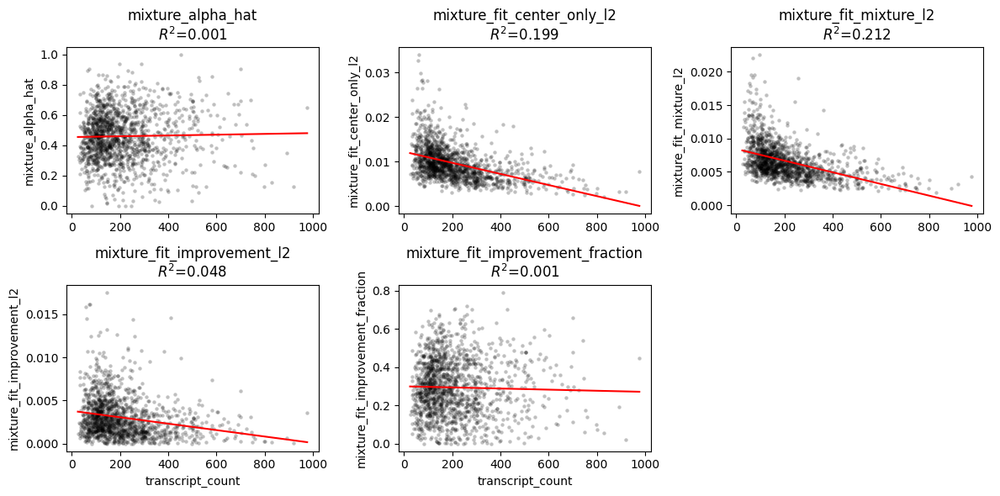

In [24]:
plt.style.use("default")
plot_rs_against_counts(cell_df, "transcript_count",
                       ycols=[
                        'mixture_alpha_hat', 
                        'mixture_fit_center_only_l2',
                        'mixture_fit_mixture_l2',
                        'mixture_fit_improvement_l2', 
                        'mixture_fit_improvement_fraction',
                    ])

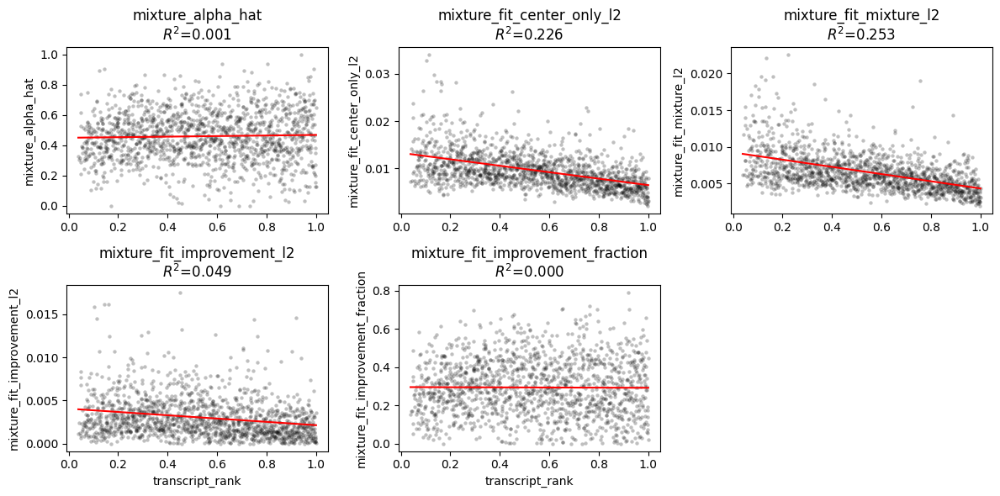

In [23]:
cell_df["transcript_rank"] = cell_df["transcript_count"].rank(pct=True)
plot_rs_against_counts(cell_df, "transcript_rank",
                       ycols=[
                        'mixture_alpha_hat', 
                        'mixture_fit_center_only_l2', 
                        'mixture_fit_mixture_l2',
                        'mixture_fit_improvement_l2', 
                        'mixture_fit_improvement_fraction',
                    ])

In [29]:
from scipy.stats import linregress

def scatter(cell_df, x_col, y_col):
    df_plot = cell_df[[x_col, y_col]].dropna()

    x = df_plot[x_col]
    y = df_plot[y_col]
    res = linregress(x, y)
    r2 = res.rvalue**2

    sns.scatterplot(
        data=df_plot,
        x=x_col,
        y=y_col,
        alpha=0.9,
        s=20,
        linewidth=0
    )

    sns.regplot(
        data=df_plot,
        x=x_col,
        y=y_col,
        scatter=False,
        ci=None,
        color="red",
        line_kws={"linewidth": 2}
    )

    plt.text(
        0.05, 0.95,
        f"$R^2 = {r2:.3f}$",
        transform=plt.gca().transAxes,
        ha="left",
        va="top",
        fontsize=12,
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="none", alpha=0.8)
    )

    plt.legend()

/tmp/ipykernel_2289808/1035344861.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


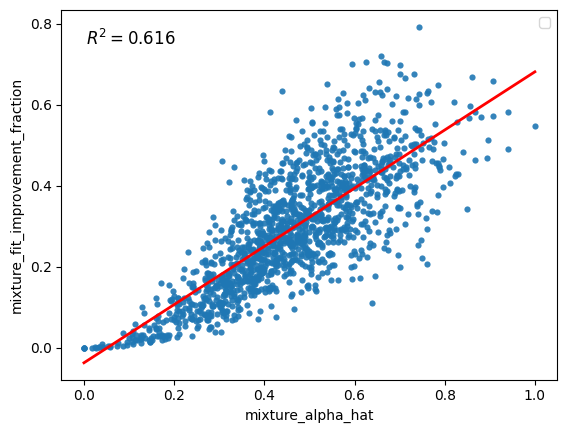

In [30]:
scatter(cell_df, "mixture_alpha_hat", "mixture_fit_improvement_fraction")

## Null-corrected cosine similarity

This is a cell-level contamination metric that asks whether a cell’s border expression profile looks more like its own center or more like the surrounding neighborhood, using cosine similarity on library-size normalized, log-transformed gene counts. For each cell, we compute two observed similarities—center vs. border and border vs. neighborhood—in a shared gene space, after filtering out cells with too few transcripts or genes.
We then generate a null expectation for each comparison by repeatedly randomly partitioning pooled counts between the two regions (while preserving total counts and region sizes), which lets us estimate a null mean, standard deviation, residual, and z-score for each similarity.
Finally, you define contamination_score = (border–neighborhood residual) − (center–border residual), so that higher values indicate borders that are unexpectedly more similar to the local environment than to the cell interior, consistent with contamination.

In [31]:
st.rs.null_corrected_center_border_similarity(n_sim=200)

,similarity_center_border,similarity_center_border_null_mean,similarity_center_border_null_sd,similarity_center_border_residual,similarity_center_border_zscore,similarity_border_neighborhood,similarity_border_neighborhood_null_mean,similarity_border_neighborhood_null_sd,similarity_border_neighborhood_residual,similarity_border_neighborhood_zscore,contamination_score,center_counts_used,border_counts_used,neighborhood_counts_used,n_genes_used,cell_id
0,0.527484,0.677307,0.027165,-0.149823,-5.515292,0.599392,0.632167,0.026410,-0.032775,-1.240998,0.117048,288,125,630,167,6327
1,0.505440,0.533815,0.033173,-0.028375,-0.855376,0.491721,0.554609,0.029030,-0.062888,-2.166349,-0.034513,125,72,484,144,6328
2,0.448379,0.573081,0.029794,-0.124703,-4.185456,0.509950,0.605730,0.028768,-0.095780,-3.329377,0.028923,271,107,380,151,6330
3,0.538128,0.659095,0.023359,-0.120966,-5.178485,0.620968,0.665188,0.022813,-0.044219,-1.938309,0.076747,344,152,896,186,6331
4,0.549761,0.599429,0.028580,-0.049669,-1.737880,0.586564,0.617863,0.023091,-0.031299,-1.355465,0.018369,227,109,715,178,6332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1557,0.498089,0.616906,0.033199,-0.118817,-3.578974,0.531000,0.618715,0.028732,-0.087716,-3.052910,0.031101,137,114,318,130,95953
1558,0.255608,0.339088,0.061410,-0.083480,-1.359377,0.404242,0.394794,0.039905,0.009448,0.236757,0.092927,58,18,357,119,95954
1559,0.390033,0.452667,0.056749,-0.062633,-1.103702,0.393295,0.435235,0.053980,-0.041940,-0.776947,0.020694,63,24,89,63,95955
1560,0.412926,0.398777,0.069044,0.014149,0.204925,0.345856,0.317715,0.046286,0.028141,0.607980,0.013992,49,15,162,96,95959


In [33]:
features = (['similarity_center_border', 
             'similarity_center_border_null_mean', 
             'similarity_center_border_null_sd', 
             'similarity_center_border_residual', 
             'similarity_center_border_zscore', 
             'similarity_border_neighborhood',
             'similarity_border_neighborhood_null_mean', 
             'similarity_border_neighborhood_null_sd', 
             'similarity_border_neighborhood_residual', 
             'similarity_border_neighborhood_zscore', 
             'contamination_score',
             # Chi2 metrics
             'chi2_center_border_stat', 
            'chi2_center_border_pvalue', 
            'chi2_center_border_dof', 
            'chi2_center_border_cramers_v',
            "candidate_contaminated_chi2",
            # Mixture-fit metrics
             'mixture_alpha_hat', 
             'mixture_fit_center_only_l2', 
             'mixture_fit_mixture_l2',
             'mixture_fit_improvement_l2', 
             'mixture_fit_improvement_fraction',
             # Fisher's exact test metrics
             #'fisher_center_border_logprob',    
             #'fisher_center_border_pvalue',
            # Baseline metric
             'transcript_count'])
cell_df = []
obs = sdata.tables['table'].obs[features].copy()
obs['sample'] = "xenium"
cell_df.append(obs)
cell_df = pd.concat(cell_df)
print(cell_df.shape)
cell_df = cell_df.reset_index(drop=True)
cell_df.head()

(1563, 23)


,similarity_center_border,similarity_center_border_null_mean,similarity_center_border_null_sd,similarity_center_border_residual,similarity_center_border_zscore,similarity_border_neighborhood,similarity_border_neighborhood_null_mean,similarity_border_neighborhood_null_sd,similarity_border_neighborhood_residual,similarity_border_neighborhood_zscore,...,chi2_center_border_dof,chi2_center_border_cramers_v,candidate_contaminated_chi2,mixture_alpha_hat,mixture_fit_center_only_l2,mixture_fit_mixture_l2,mixture_fit_improvement_l2,mixture_fit_improvement_fraction,transcript_count,sample
0,0.527484,0.677307,0.027165,-0.149823,-5.515292,0.599392,0.632167,0.026410,-0.032775,-1.240998,...,107.0,0.605800,False,0.385151,0.007550,0.005838,0.001712,0.226761,420.0,xenium
1,0.505440,0.533815,0.033173,-0.028375,-0.855376,0.491721,0.554609,0.029030,-0.062888,-2.166349,...,77.0,0.656182,False,0.344899,0.007505,0.005206,0.002298,0.306241,201.0,xenium
2,0.448379,0.573081,0.029794,-0.124703,-4.185456,0.509950,0.605730,0.028768,-0.095780,-3.329377,...,107.0,0.621287,False,0.335242,0.008393,0.007802,0.000591,0.070448,391.0,xenium
3,0.538128,0.659095,0.023359,-0.120966,-5.178485,0.620968,0.665188,0.022813,-0.044219,-1.938309,...,130.0,0.635566,False,0.540361,0.009900,0.006374,0.003526,0.356171,512.0,xenium
4,0.549761,0.599429,0.028580,-0.049669,-1.737880,0.586564,0.617863,0.023091,-0.031299,-1.355465,...,93.0,0.598593,False,0.611368,0.009323,0.007708,0.001614,0.173168,345.0,xenium


/tmp/ipykernel_2289808/1035344861.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


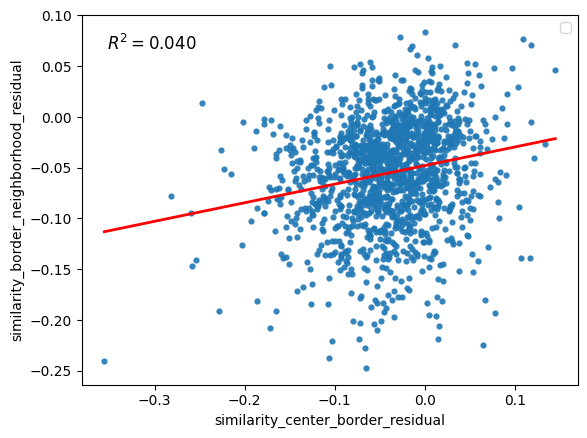

In [41]:
scatter(cell_df, "similarity_center_border_residual", "similarity_border_neighborhood_residual")

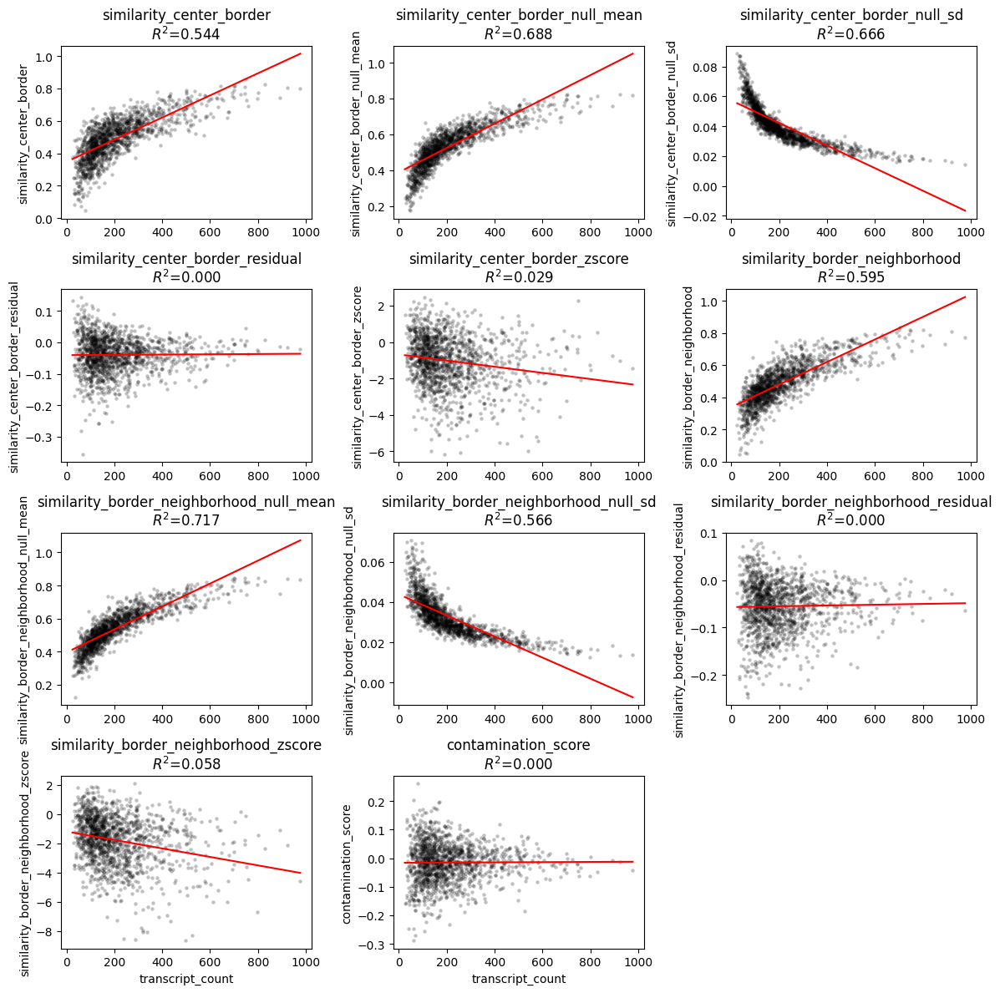

In [49]:
plt.style.use("default")
plot_rs_against_counts(cell_df, "transcript_count",
                       ycols=[
                        'similarity_center_border',
                        'similarity_center_border_null_mean', 
                        'similarity_center_border_null_sd', 
                        'similarity_center_border_residual', 
                        'similarity_center_border_zscore', 
                        'similarity_border_neighborhood',
                        'similarity_border_neighborhood_null_mean', 
                        'similarity_border_neighborhood_null_sd', 
                        'similarity_border_neighborhood_residual', 
                        'similarity_border_neighborhood_zscore', 
                        'contamination_score'
                    ])

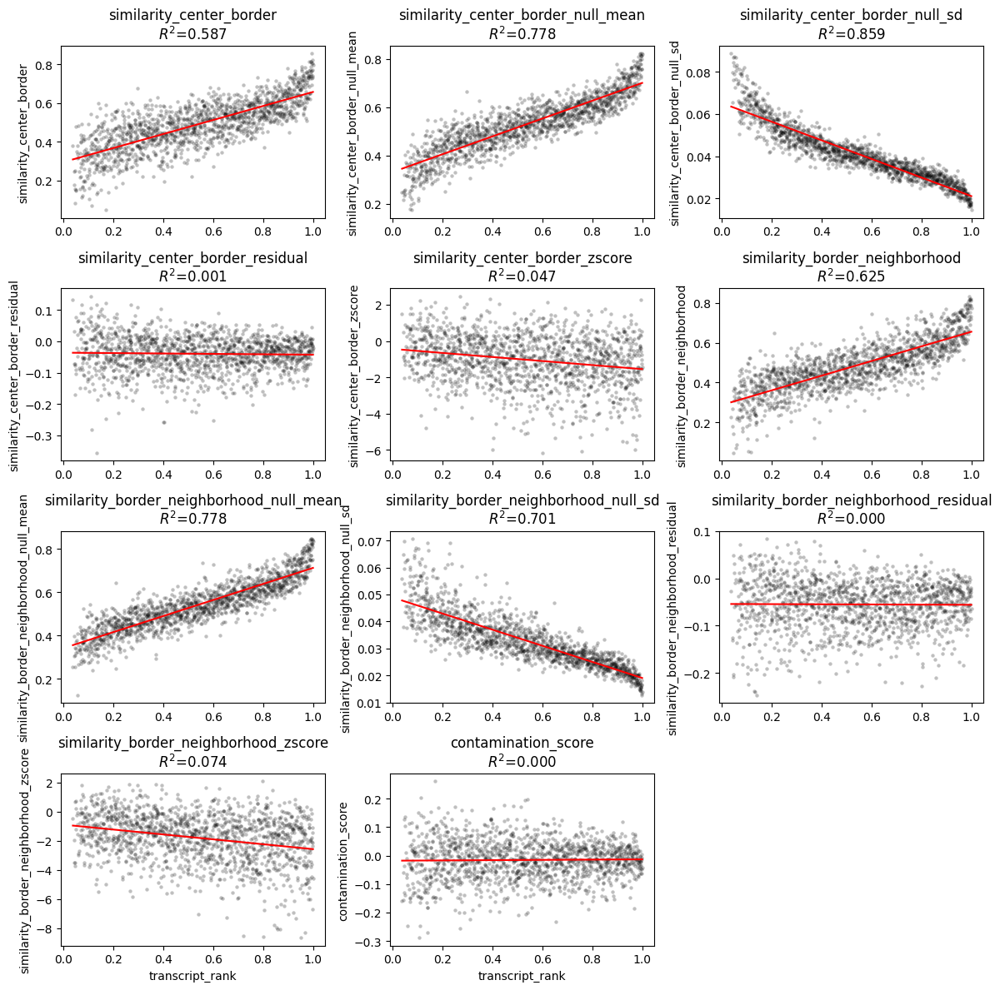

In [50]:
cell_df["transcript_rank"] = cell_df["transcript_count"].rank(pct=True)
plot_rs_against_counts(cell_df, "transcript_rank",
                       ycols=[
                        'similarity_center_border',
                        'similarity_center_border_null_mean', 
                        'similarity_center_border_null_sd', 
                        'similarity_center_border_residual', 
                        'similarity_center_border_zscore', 
                        'similarity_border_neighborhood',
                        'similarity_border_neighborhood_null_mean', 
                        'similarity_border_neighborhood_null_sd', 
                        'similarity_border_neighborhood_residual', 
                        'similarity_border_neighborhood_zscore', 
                        'contamination_score'
                    ])

/tmp/ipykernel_2289808/1035344861.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


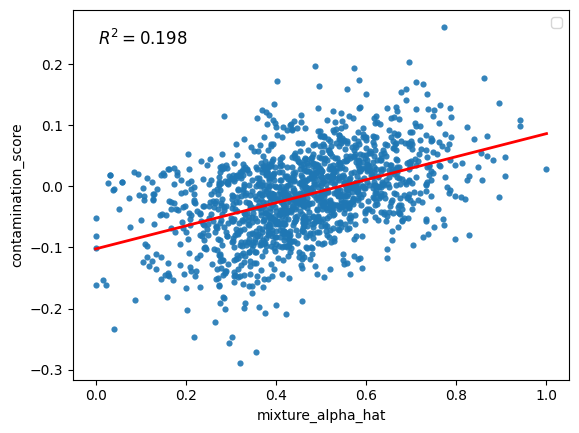

In [36]:
scatter(cell_df, 'mixture_alpha_hat', 'contamination_score')

/tmp/ipykernel_2289808/1035344861.py:40: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


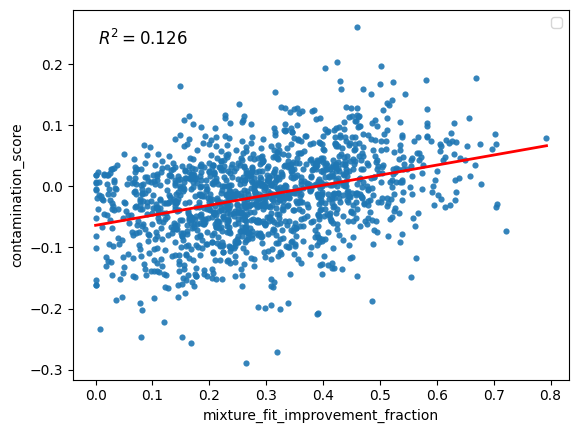

In [37]:
scatter(cell_df, 'mixture_fit_improvement_fraction', 'contamination_score')

In [38]:
from scipy.stats import linregress

def scatter_r2(cell_df, x_col, y_col, highlight_col):
    df_plot = cell_df[[x_col, y_col, highlight_col]].dropna()

    x = df_plot[x_col]
    y = df_plot[y_col]
    res = linregress(x, y)
    r2 = res.rvalue**2

    # Background cells
    sns.scatterplot(
        data=df_plot[~df_plot[highlight_col]],
        x=x_col,
        y=y_col,
        alpha=0.2,
        s=10,
        linewidth=0,
        color="black"
    )

    # Highlighted contaminated cells
    sns.scatterplot(
        data=df_plot[df_plot[highlight_col]],
        x=x_col,
        y=y_col,
        alpha=0.9,
        s=20,
        linewidth=0,
        color="red",
        label="candidate contaminated"
    )

    sns.regplot(
        data=df_plot,
        x=x_col,
        y=y_col,
        scatter=False,
        ci=None,
        color="red",
        line_kws={"linewidth": 2}
    )

    plt.text(
        0.05, 0.95,
        f"$R^2 = {r2:.3f}$",
        transform=plt.gca().transAxes,
        ha="left",
        va="top",
        fontsize=12,
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="none", alpha=0.8)
    )

    plt.legend()

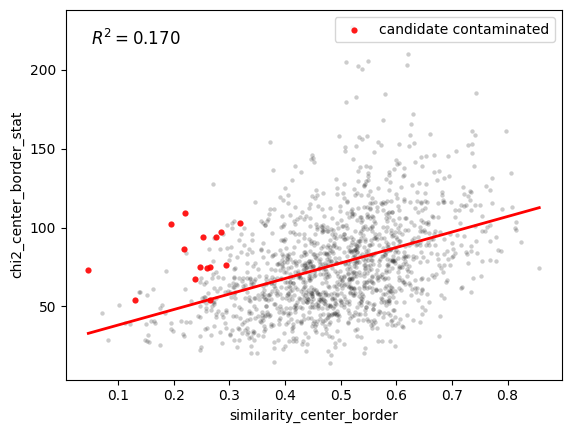

In [39]:
scatter_r2(cell_df, "similarity_center_border", "chi2_center_border_stat", highlight_col="candidate_contaminated_chi2")

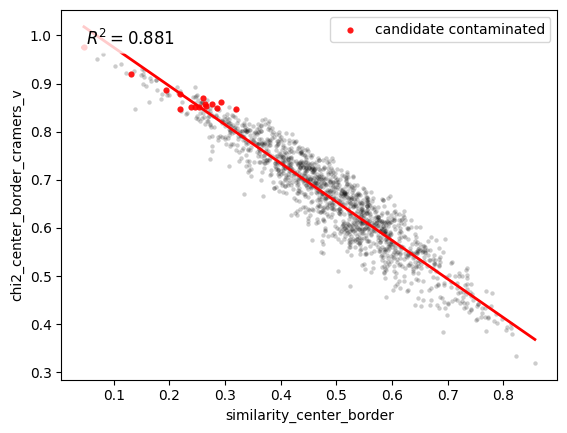

In [40]:
scatter_r2(cell_df, "similarity_center_border", "chi2_center_border_cramers_v", highlight_col="candidate_contaminated_chi2")

## Spatial visualizations

In [42]:
adata_ref = ad.read_h5ad("../../data/BC_scRNAseq_Janesick.h5ad")

In [43]:
st.run_label_transfer(
        adata_ref, ref_cell_type="celltype_major", inplace=True, ref_ensemble_key=None, query_ensemble_key=None
    )

/g/huber/users/lazic/src/SegTraQ/src/segtraq/utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ref_mean_df = counts_df.groupby("celltype").mean()
/g/huber/users/lazic/src/SegTraQ/src/segtraq/SegTraQ.py:762: RuntimeWarning: Spatialdata table appears to contain raw counts. Counts will be log1p-transformed before running label transfer.Raw counts will be stored in `adata_q.layers["counts"]`.
  result = _run_label_transfer(


In [44]:
# Define color palette for plotting
col_celltype = {
    "T": "#fb8072",
    "B": "#bc80bd",
    "macro": "#910290",
    "dendritic": "#fdb462",
    "mast": "#959059",
    "perivas": "#fed9a6",
    "endo": "#a6cee3",
    "myoepi": "#2782bb",
    "DCIS1": "#3c7761",
    "DCIS2": "#66a61e",
    "tumor": "#66c2a5",
    "stromal": "#d45943",
    "Unknown": "#808080",
}

In [45]:
# Replace NaN with Unknown for plotting

s = st.sdata.tables["table"].obs["transferred_cell_type"]
if pd.api.types.is_categorical_dtype(s):
    s = s.cat.add_categories(["Unknown"])

st.sdata.tables["table"].obs["transferred_celltype_plot"] = s.fillna("Unknown")

/tmp/ipykernel_2289808/3220636980.py:4: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(s):


In [46]:
def plot_feature_labels(sdata, method, feature, axes):
    labels = sdata.tables["table"].obs["transferred_celltype_plot"].unique().astype(str).tolist()
    cols = [col_celltype[lab] for lab in labels]

    sdata.tables["table"].obs["region"] = "cell_boundaries"
    sdata.set_table_annotates_spatialelement("table", region="cell_boundaries")

    sdata.pl.render_shapes(
        "cell_boundaries",
        color="transferred_celltype_plot",
        palette=cols,
        groups=labels,
        outline_color="white",
        outline_width=0.5,
    ).pl.show(ax=axes[0], title=f"{method}:Cell boundaries colored by cell type", coordinate_systems="global")

    sdata.pl.render_shapes(
        "cell_boundaries",
        color=feature,
        outline_color="white",
        outline_width=0.5,
    ).pl.show(ax=axes[1], title=f"{method}: {feature}", coordinate_systems="global")

/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:481: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


WARNING  Found 138 NaN values in color data. These observations will be colored with the 'na_color'.               


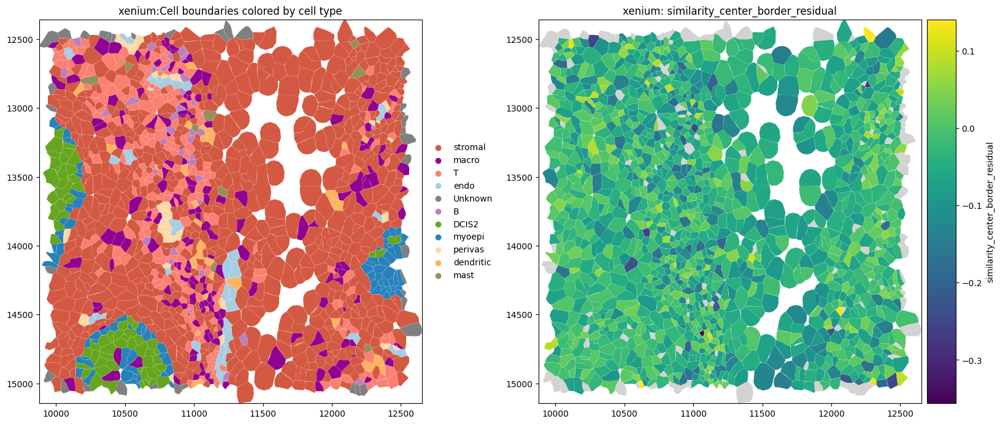

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10), constrained_layout=True)
#axes = np.atleast_2d(axes)

plot_feature_labels(st.sdata, "xenium", "similarity_center_border_residual", axes)

/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:481: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


WARNING  Found 138 NaN values in color data. These observations will be colored with the 'na_color'.               


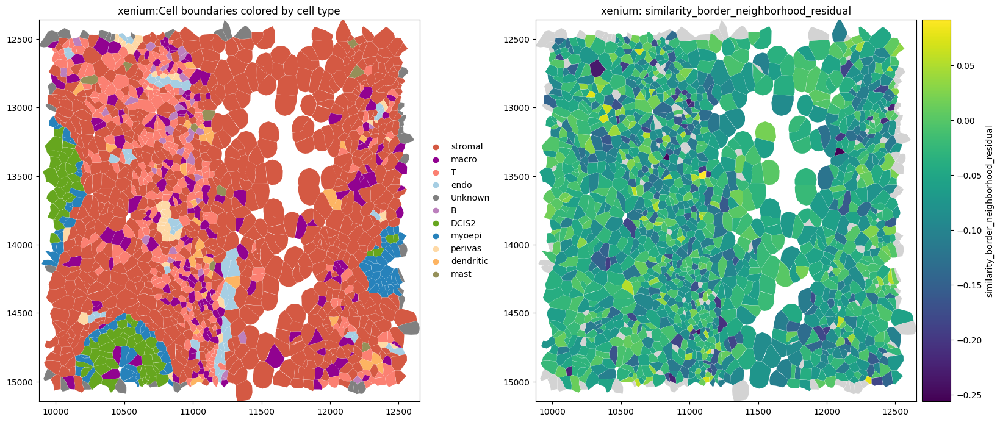

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10), constrained_layout=True)
plot_feature_labels(sdata, "xenium", "similarity_border_neighborhood_residual", axes)

/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:481: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


WARNING  Found 138 NaN values in color data. These observations will be colored with the 'na_color'.               


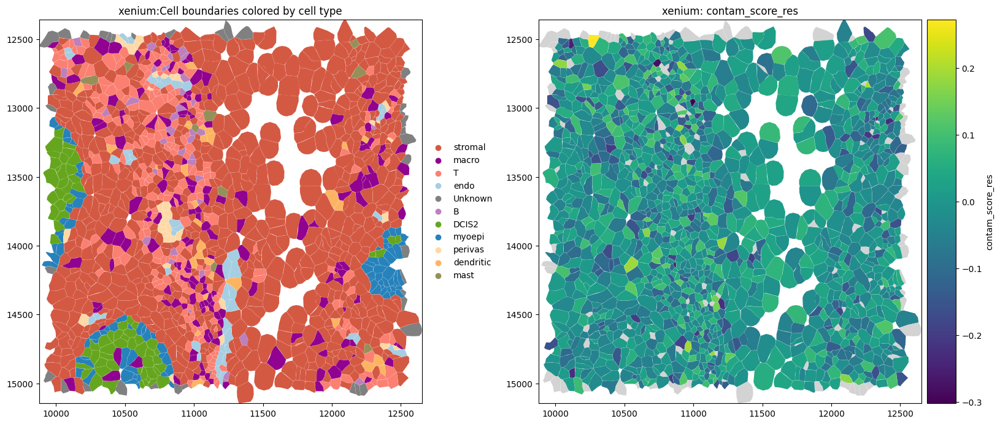

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10), constrained_layout=True)
plot_feature_labels(sdata, "xenium", "contam_score_res", axes)

In [ ]:
sdata.tables["table"].obs["contam_score_bin"] = sdata.tables["table"].obs["contam_score_res"]>0.1

/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:481: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


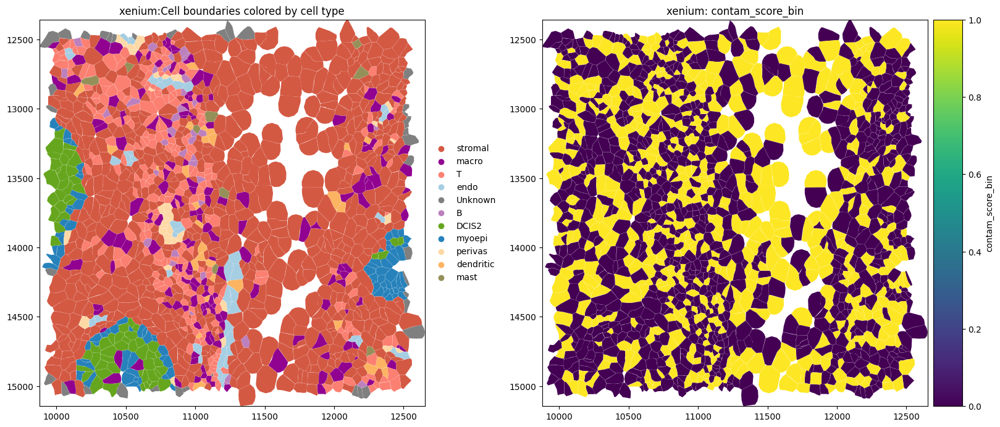

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10), constrained_layout=True)
plot_feature_labels(sdata, "xenium", "contam_score_bin", axes)

/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:481: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


WARNING  Found 138 NaN values in color data. These observations will be colored with the 'na_color'.               


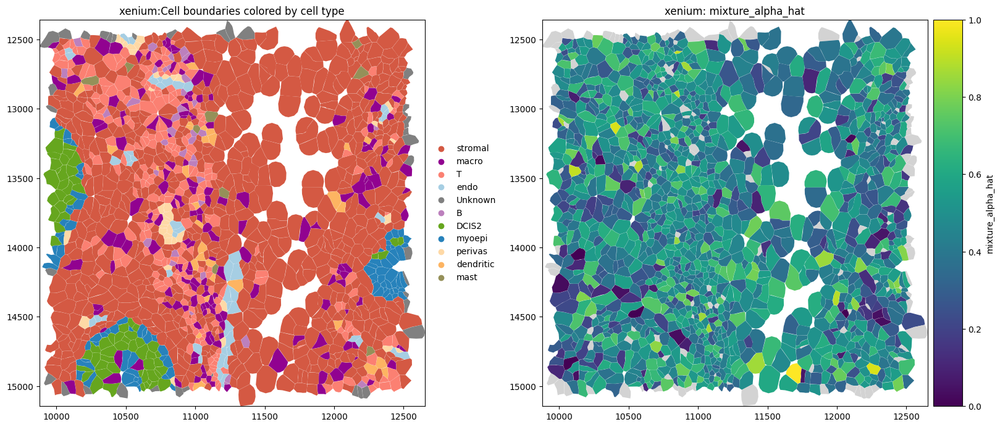

In [47]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10), constrained_layout=True)
#axes = np.atleast_2d(axes)

plot_feature_labels(st.sdata, "xenium", "mixture_alpha_hat", axes)

/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:481: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


WARNING  Found 138 NaN values in color data. These observations will be colored with the 'na_color'.               


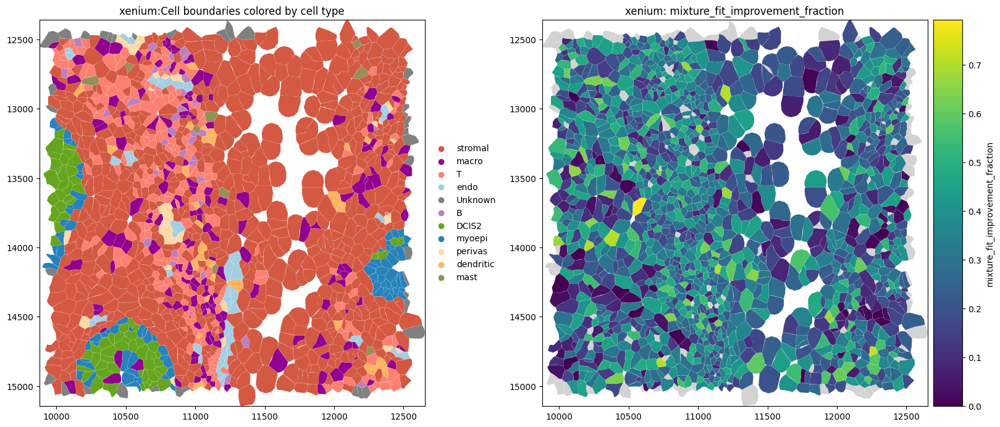

In [48]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10), constrained_layout=True)
#axes = np.atleast_2d(axes)

plot_feature_labels(st.sdata, "xenium", "mixture_fit_improvement_fraction", axes)

In [ ]:
import math

from segtraq.rs.utils import _get_center_border_counts, _compute_ncvs_within_radius


def _normalize_with_pseudocount(x: np.ndarray, pseudocount: float = 0.5) -> np.ndarray:
    x = np.asarray(x, dtype=float).ravel()
    x = x + pseudocount
    total = x.sum()
    if total <= 0:
        return np.zeros_like(x, dtype=float)
    return x / total


def _get_top_genes_for_cell(
    sdata,
    cid,
    n_genes: int = 5,
    mode: str = "absolute",  # "absolute" or "neighborhood_vs_center"
    tables_key: str = "table",
    cell_id_key: str = "cell_id",
    expr_center_raw: pd.DataFrame | None = None,
    expr_neighborhood_raw: pd.DataFrame | None = None,
    pseudocount: float = 0.5,
):
    """
    Select top genes for one cell.

    Parameters
    ----------
    mode : str
        "absolute" -> top genes by absolute counts from the cell-level table
        "neighborhood_vs_center" -> top genes with largest (p_neighborhood - p_center)
    expr_center_raw : pd.DataFrame or None
        Precomputed center count matrix, cells x genes. Required for
        mode="neighborhood_vs_center".
    expr_neighborhood_raw : pd.DataFrame or None
        Precomputed neighborhood count matrix, cells x genes. Required for
        mode="neighborhood_vs_center".
    """
    obs = sdata[tables_key].obs
    mask = obs[cell_id_key] == cid
    if mask.sum() == 0:
        return []

    if mode == "absolute":
        adata_sub = sdata[tables_key][mask, :]
        X = adata_sub.X.toarray() if hasattr(adata_sub.X, "toarray") else np.asarray(adata_sub.X)
        expr_vector = np.asarray(X).ravel()

        nonzero = expr_vector > 0
        if nonzero.sum() == 0:
            return []

        genes_nonzero = adata_sub.var_names[nonzero]
        expr_nonzero = expr_vector[nonzero]

        return (
            pd.Series(expr_nonzero, index=genes_nonzero)
            .sort_values(ascending=False)
            .head(n_genes)
            .index
            .tolist()
        )

    if mode == "neighborhood_vs_center":
        if expr_center_raw is None or expr_neighborhood_raw is None:
            raise ValueError(
                "`expr_center_raw` and `expr_neighborhood_raw` must be provided "
                "for mode='neighborhood_vs_center'."
            )

        if cid not in expr_center_raw.index or cid not in expr_neighborhood_raw.index:
            return []

        common_genes = expr_center_raw.columns.intersection(expr_neighborhood_raw.columns)
        if len(common_genes) == 0:
            return []

        x_center = expr_center_raw.loc[cid, common_genes].to_numpy(dtype=float)
        x_neighborhood = expr_neighborhood_raw.loc[cid, common_genes].to_numpy(dtype=float)

        p_center = _normalize_with_pseudocount(x_center, pseudocount=pseudocount)
        p_neighborhood = _normalize_with_pseudocount(x_neighborhood, pseudocount=pseudocount)

        score = pd.Series(p_center - p_neighborhood, index=common_genes)# this only shows genes that are present in center but not in NH, maybe use a better approach!!

        keep = x_center > 0
        score = score[keep]
        if score.empty:
            return []

        return score.sort_values(ascending=False).head(n_genes).index.tolist()

    raise ValueError("`mode` must be 'absolute' or 'neighborhood_vs_center'.")


def plot_cell_with_metric_and_genes(
    sdata,
    cid,
    feature: str,
    genes: list[str] | None = None,
    title: str | None = None,
    palette: list[str] | None = None,
    pix_to_um_scale_factor: float = 0.2125,
    repositioned_transcripts: bool = False,
    padding: float = 200,
    center_layer: str = "cell_centers",
    outer_layer: str = "cell_boundaries",
    tables_key: str = "table",
    points_key: str = "transcripts",
    cell_id_key: str = "cell_id",
    gene_key: str = "feature_name",
    ax=None,
):
    """
    Plot one focal cell, color shapes by `feature`, and overlay selected transcripts.
    """
    if cid not in sdata[outer_layer].index:
        raise KeyError(f"Cell id {cid} not found in `{outer_layer}`.")

    centroid_x_cell_px = sdata[outer_layer].loc[cid].geometry.centroid.x
    centroid_y_cell_px = sdata[outer_layer].loc[cid].geometry.centroid.y

    centroid_x_cell = centroid_x_cell_px / pix_to_um_scale_factor
    centroid_y_cell = centroid_y_cell_px / pix_to_um_scale_factor

    trans = sdata.points[points_key].compute().copy()
    trans["focal_cell"] = "other_cells"
    trans.loc[trans[cell_id_key] == cid, "focal_cell"] = "focal_cell"
    trans["focal_cell"] = trans["focal_cell"].astype("category")

    temp_points_key = "transcripts__temp_plot"

    if repositioned_transcripts:
        trans = trans.drop(columns=["x", "y", "z"], errors="ignore")
        trans = trans.rename(
            columns={
                "repositioned_x": "x",
                "repositioned_y": "y",
                "repositioned_z": "z",
            }
        )

    sdata.points[temp_points_key] = sd.models.PointsModel.parse(trans)
    T = sd.transformations.get_transformation(sdata.points[points_key])
    sd.transformations.set_transformation(sdata.points[temp_points_key], T)

    sdata_cropped = sdata.query.bounding_box(
        axes=["x", "y"],
        min_coordinate=[centroid_x_cell - padding, centroid_y_cell - padding],
        max_coordinate=[centroid_x_cell + padding, centroid_y_cell + padding],
        target_coordinate_system="global",
    )

    if ax is None:
        _, ax = plt.subplots(1, 1, figsize=(8, 8), constrained_layout=True)

    plot = (
        sdata_cropped.pl.render_shapes(
            element=center_layer,
            fill_alpha=0.2,
            outline_alpha=1.0,
            outline_width=0.5,
            outline_color="black",
        )
        .pl.render_shapes(
            element=outer_layer,
            color=feature,
            fill_alpha=0.4,
            outline_alpha=1.0,
            outline_width=0.7,
            outline_color="blue",
        )
    )

    if genes is None or len(genes) == 0:
        plot = plot.pl.render_points(
            temp_points_key,
            color="focal_cell",
            fill_alpha=0.2,
            size=4.0,
            groups=["focal_cell"],
            palette=["red"],
        )
    else:
        if palette is None:
            base_palette = [
                "red", "blue", "green", "orange", "purple",
                "brown", "pink", "gray", "olive", "cyan"
            ]
            palette = [base_palette[i % len(base_palette)] for i in range(len(genes))]

        plot = plot.pl.render_points(
            temp_points_key,
            color=gene_key,
            fill_alpha=0.7,
            groups=genes,
            size=4.0,
            palette=palette,
        )

    plot.pl.show(
        ax=ax,
        title=title if title is not None else f"Cell {cid}",
        colorbar=True,
    )

    ax.scatter(
        [centroid_x_cell],
        [centroid_y_cell],
        marker="+",
        s=400,
        c="black",
        linewidths=2,
        zorder=10,
        alpha=0.4,
    )


def plot_top_cells_by_metric(
    sdata,
    feature: str,
    n_cells: int = 6,
    n_genes: int = 5,
    gene_selection_mode: str = "neighborhood_vs_center",  # "absolute" or "neighborhood_vs_center"
    tables_key: str = "table",
    cell_id_key: str = "cell_id",
    points_key: str = "transcripts",
    gene_key: str = "feature_name",
    center_layer: str = "cell_centers",
    outer_layer: str = "cell_boundaries",
    pix_to_um_scale_factor: float = 0.2125,
    repositioned_transcripts: bool = False,
    padding: float = 200,
    skip_first: int = 0,
    palette: list[str] | None = None,
    figsize_per_panel: tuple[float, float] = (8, 6),
    pseudocount: float = 0.5,
    # parameters used only if gene_selection_mode == "neighborhood_vs_center"
    shapes_key: str = "cell_boundaries",
    points_background_id: str = "UNASSIGNED",
    points_x_key: str = "x",
    points_y_key: str = "y",
    erosion_fraction_of_radius: float = 0.2,
    neighborhood_radius_factor: float = 2.0,
):
    """
    Plot the top `n_cells` cells ranked by `feature`.

    For each selected cell:
    - color the cell boundaries by `feature`
    - overlay transcripts of selected genes
    - show cell_id and metric value in the title

    Gene selection modes
    --------------------
    absolute:
        top genes by absolute whole-cell counts

    neighborhood_vs_center:
        top genes with largest (p_neighborhood - p_center) for that cell,
        using precomputed center and neighborhood count matrices
    """
    obs = sdata[tables_key].obs.copy()

    if feature not in obs.columns:
        raise KeyError(f"`{feature}` not found in `sdata[{tables_key!r}].obs`.")
    if cell_id_key not in obs.columns:
        raise KeyError(f"`{cell_id_key}` not found in `sdata[{tables_key!r}].obs`.")

    df_rank = (
        obs[[cell_id_key, feature]]
        .dropna()
        .sort_values(feature, ascending=False)
        .iloc[skip_first: skip_first + n_cells]
        .copy()
    )

    if df_rank.empty:
        raise ValueError(f"No cells available to plot for feature `{feature}`.")

    selected_cell_ids = df_rank[cell_id_key].tolist()

    expr_center_raw = None
    expr_neighborhood_raw = None

    if gene_selection_mode == "neighborhood_vs_center":
        expr_center_raw, _ = _get_center_border_counts(
            sdata=sdata,
            tables_key=tables_key,
            tables_cell_id_key=cell_id_key,
            shapes_key=shapes_key,
            points_key=points_key,
            points_cell_id_key=cell_id_key,
            points_background_id=points_background_id,
            points_x_key=points_x_key,
            points_y_key=points_y_key,
            points_gene_key=gene_key,
            erosion_fraction_of_radius=erosion_fraction_of_radius,
        )

        expr_neighborhood_raw = _compute_ncvs_within_radius(
            sdata=sdata,
            tables_key=tables_key,
            tables_cell_id_key=cell_id_key,
            shapes_key=shapes_key,
            neighborhood_radius_factor=neighborhood_radius_factor,
        )

    n_panels = len(selected_cell_ids)
    ncols = min(3, n_panels)
    nrows = math.ceil(n_panels / ncols)

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(figsize_per_panel[0] * ncols, figsize_per_panel[1] * nrows),
        constrained_layout=True,
    )
    axes = np.atleast_1d(axes).ravel()

    for ax, cid in zip(axes, selected_cell_ids):
        metric_value = df_rank.loc[df_rank[cell_id_key] == cid, feature].iloc[0]

        genes = _get_top_genes_for_cell(
            sdata=sdata,
            cid=cid,
            n_genes=n_genes,
            mode=gene_selection_mode,
            tables_key=tables_key,
            cell_id_key=cell_id_key,
            expr_center_raw=expr_center_raw,
            expr_neighborhood_raw=expr_neighborhood_raw,
            pseudocount=pseudocount,
        )

        title = (
            f"cell_id={cid}\n"
            f"{feature}={metric_value:.3g}\n"
            f"gene mode: {gene_selection_mode}\n"
            f"top genes: {', '.join(genes) if len(genes) > 0 else 'none'}"
        )

        plot_cell_with_metric_and_genes(
            sdata=sdata,
            cid=cid,
            feature=feature,
            genes=genes,
            title=title,
            palette=palette,
            pix_to_um_scale_factor=pix_to_um_scale_factor,
            repositioned_transcripts=repositioned_transcripts,
            padding=padding,
            center_layer=center_layer,
            outer_layer=outer_layer,
            tables_key=tables_key,
            points_key=points_key,
            cell_id_key=cell_id_key,
            gene_key=gene_key,
            ax=ax,
        )

    for ax in axes[len(selected_cell_ids):]:
        ax.axis("off")

    return fig, axes[:len(selected_cell_ids)]

/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: UserWarning: The object has `points` element. Depending on the number of points, querying MAY suffer from performance issues. Please consider filtering the object before calling this function by calling the `subset()` method of `SpatialData`.
  return dispatch(args[0].__class__)(*args, **kw)


WARNING  Found 3 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 1 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 1 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 2 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 4 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 2 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 4 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

(<Figure size 2400x1800 with 18 Axes>,
 array([<Axes: title={'center': 'cell_id=77205\ncontamination_score=0.261\ngene mode: absolute\ntop genes: CXCL12, LUM, CCDC80, PTGDS, POSTN'}>,
        <Axes: title={'center': 'cell_id=95795\ncontamination_score=0.204\ngene mode: absolute\ntop genes: POSTN, MMP2, MRC1, VOPP1, CD14'}>,
        <Axes: title={'center': 'cell_id=76723\ncontamination_score=0.196\ngene mode: absolute\ntop genes: LUM, IL7R, CCDC80, POSTN, PTPRC'}>,
        <Axes: title={'center': 'cell_id=76869\ncontamination_score=0.193\ngene mode: absolute\ntop genes: CCDC80, CXCL12, CD8A, LUM, CD3E'}>,
        <Axes: title={'center': 'cell_id=77436\ncontamination_score=0.177\ngene mode: absolute\ntop genes: TRAC, IL7R, PTPRC, CD3E, CXCR4'}>,
        <Axes: title={'center': 'cell_id=76800\ncontamination_score=0.173\ngene mode: absolute\ntop genes: LUM, KLRB1, CCND1, CXCL12, LDHB'}>,
        <Axes: title={'center': 'cell_id=95304\ncontamination_score=0.172\ngene mode: absolute\ntop gen

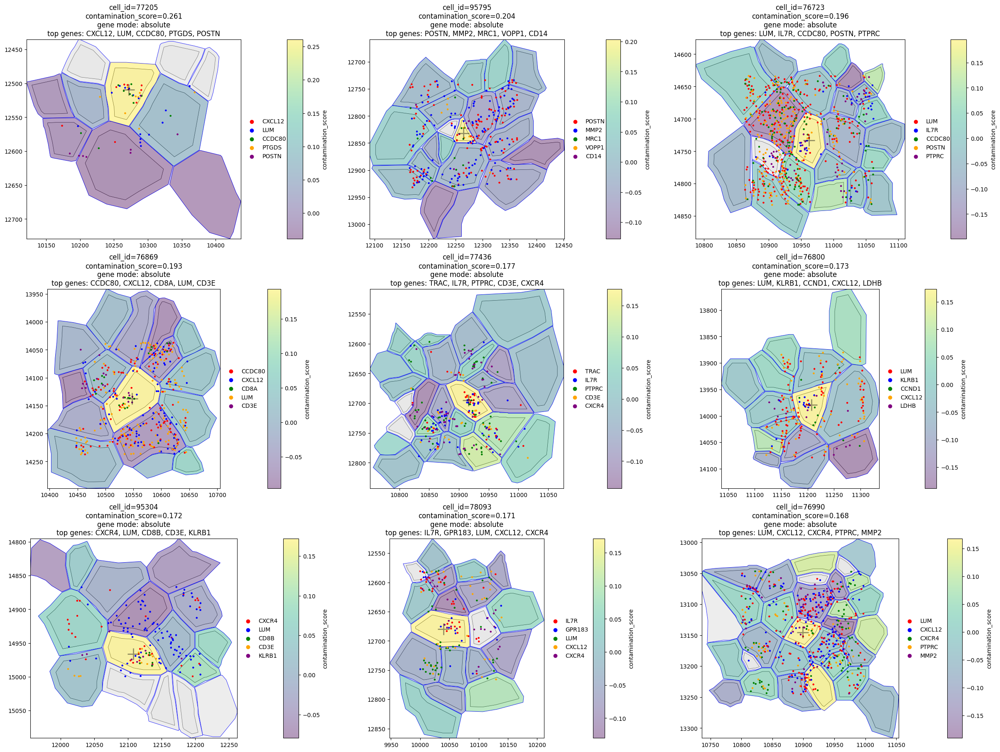

In [132]:
plot_top_cells_by_metric(
    sdata,
    feature="contamination_score",
    gene_selection_mode="absolute",
    n_cells=9,
    n_genes=5,
    padding=100,
)

/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: UserWarning: The object has `points` element. Depending on the number of points, querying MAY suffer from performance issues. Please consider filtering the object before calling this function by calling the `subset()` method of `SpatialData`.
  return dispatch(args[0].__class__)(*args, **kw)


WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 1 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 1 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 6 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 2 NaN values in color data. These observations will be colored with the 'na_color'.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)


WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.scatter(
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: UserWarning: The object has `points` element. Depending on the number of points, querying MAY suffer from performance issues. Please consider filtering the object before calling this function by calling the `subset()` method of `SpatialData`.
  return dispatch(args[0].__class__)(*args, **kw)


WARNING  Found 1 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 1 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 2 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

(<Figure size 2400x1800 with 18 Axes>,
 array([<Axes: title={'center': 'cell_id=6348\nmixture_alpha_hat=1\ntop genes: LUM, ITM2C, TENT5C, CXCL12, POSTN'}>,
        <Axes: title={'center': 'cell_id=77225\nmixture_alpha_hat=0.941\ntop genes: LUM, POSTN, CD3E, PTGDS, IL7R'}>,
        <Axes: title={'center': 'cell_id=95286\nmixture_alpha_hat=0.941\ntop genes: TENT5C, ITM2C, SEC11C, GPR183, ERN1'}>,
        <Axes: title={'center': 'cell_id=77975\nmixture_alpha_hat=0.907\ntop genes: ERBB2, CCND1, TCIM, TACSTD2, KRT7'}>,
        <Axes: title={'center': 'cell_id=77533\nmixture_alpha_hat=0.907\ntop genes: LYZ, GPR183, ITGAX, GLIPR1, PTPRC'}>,
        <Axes: title={'center': 'cell_id=77113\nmixture_alpha_hat=0.895\ntop genes: IL7R, LDHB, GPR183, LUM, KLRB1'}>,
        <Axes: title={'center': 'cell_id=95635\nmixture_alpha_hat=0.894\ntop genes: IL7R, LUM, CXCL12, POSTN, PTGDS'}>,
        <Axes: title={'center': 'cell_id=77452\nmixture_alpha_hat=0.881\ntop genes: LUM, CCDC80, PDGFRB, AQP1, ZEB2'}>,

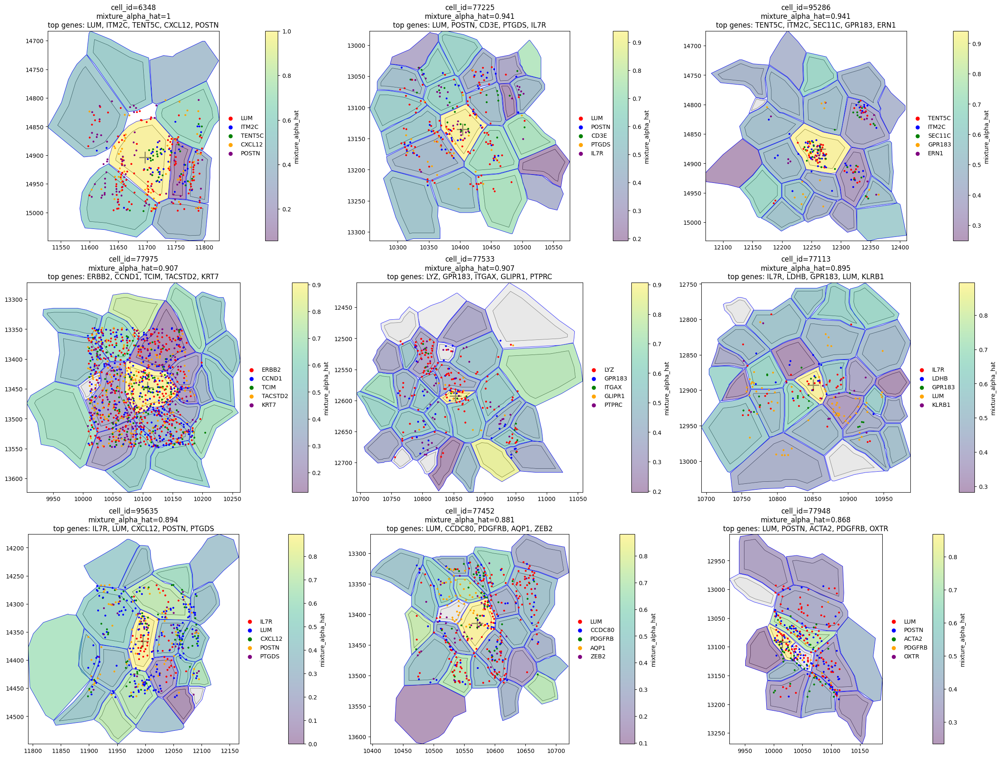

In [ ]:
plot_top_cells_by_metric(
    sdata,
    feature="mixture_alpha_hat",
    gene_selection_mode="absolute",
    n_cells=9,
    n_genes=5,
    padding=100,
)

/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: UserWarning: The object has `points` element. Depending on the number of points, querying MAY suffer from performance issues. Please consider filtering the object before calling this function by calling the `subset()` method of `SpatialData`.
  return dispatch(args[0].__class__)(*args, **kw)


WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 1 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 2 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

WARNING  Found 1 NaN values in color data. These observations will be colored with the 'na_color'.                 
WARNING  No table name provided, using 'table' as fallback for color mapping.                                      
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)
/home/lazic/.venvs/segtraq_26/lib/python3.11/site-packages/spatialdata_plot/pl/render.py:928: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = ax.

(<Figure size 2400x1800 with 18 Axes>,
 array([<Axes: title={'center': 'cell_id=77017\nmixture_fit_improvement_fraction=0.793\ntop genes: LUM, AIF1, CCDC80, C1QC, FCER1G'}>,
        <Axes: title={'center': 'cell_id=95269\nmixture_fit_improvement_fraction=0.721\ntop genes: CPA3, LUM, POSTN, CTSG, TPSAB1'}>,
        <Axes: title={'center': 'cell_id=76951\nmixture_fit_improvement_fraction=0.706\ntop genes: LUM, POSTN, IL7R, RUNX1, CD3E'}>,
        <Axes: title={'center': 'cell_id=78651\nmixture_fit_improvement_fraction=0.705\ntop genes: LYZ, CD1C, ITGAX, CCDC80, CD4'}>,
        <Axes: title={'center': 'cell_id=79443\nmixture_fit_improvement_fraction=0.704\ntop genes: ERBB2, KRT8, TACSTD2, KRT7, CEACAM6'}>,
        <Axes: title={'center': 'cell_id=78655\nmixture_fit_improvement_fraction=0.702\ntop genes: LUM, CCL5, POSTN, CD8A, TRAC'}>,
        <Axes: title={'center': 'cell_id=76791\nmixture_fit_improvement_fraction=0.697\ntop genes: CPA3, CTSG, LUM, KIT, ZEB2'}>,
        <Axes: title={'ce

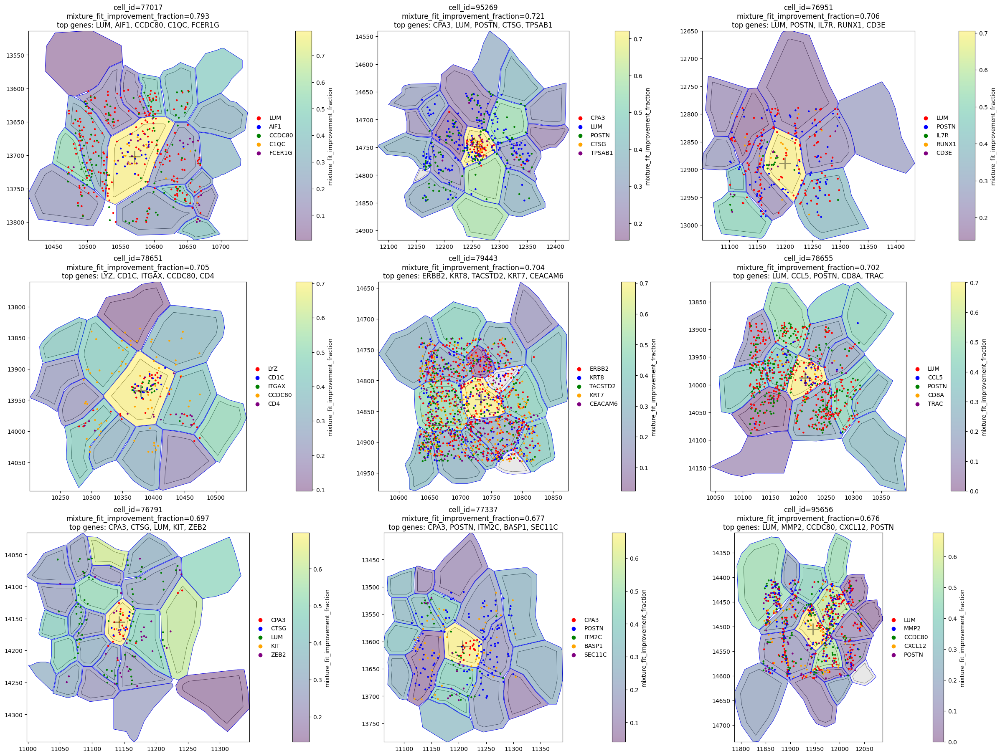

In [ ]:
plot_top_cells_by_metric(
    sdata,
    feature="mixture_fit_improvement_fraction",
    gene_selection_mode="absolute",
    n_cells=9,
    n_genes=5,
    padding=100,
)

## Comparison of null-corrected cosine-similarity for Xenium v1 (480 genes) and for Xenium Prime (5k genes) dataset

In [106]:
sdata_xenium = sd.read_zarr("/g/huber/projects/CODEX/segtraq/data/20260204_SegTraQ_sdata/xenium_v1_data/sdata_xenium_crop.zarr")
sdata_proseg2 = sd.read_zarr("/g/huber/projects/CODEX/segtraq/data/20260204_SegTraQ_sdata/xenium_v1_data/sdata_proseg_v2_crop.zarr/")
sdata_proseg3 = sd.read_zarr("/g/huber/projects/CODEX/segtraq/data/20260204_SegTraQ_sdata/xenium_v1_data/sdata_proseg_v3_crop.zarr/")

In [107]:
st_xenium = segtraq.SegTraQ(
    sdata_xenium,
    tables_centroid_x_key=None,
    tables_centroid_y_key=None,
    points_background_id=-1,  # "UNASSIGNED" for Xenium prime
)

st_proseg2 = segtraq.SegTraQ(
    sdata_proseg2,
    points_cell_id_key="assignment",
    points_background_id=None,
    points_gene_key="gene",
    tables_area_key=None,
    tables_cell_id_key="cell",
    shapes_cell_id_key="cell",
    tables_centroid_x_key="centroid_x",
    tables_centroid_y_key="centroid_y",
)

st_proseg3 = segtraq.SegTraQ(
    sdata_proseg3,
    points_cell_id_key="assignment",
    points_background_id=None,
    points_gene_key="gene",
    tables_area_key=None,
    tables_cell_id_key="cell",
    shapes_cell_id_key="cell",
    tables_centroid_x_key="centroid_x",
    tables_centroid_y_key="centroid_y",
)

/g/huber/users/lazic/src/SegTraQ/src/segtraq/SegTraQ.py:116: RuntimeWarning: No centroids specified for tables. Centroids will be automatically computed from shapes.
  validate_spatialdata(
/g/huber/users/lazic/src/SegTraQ/src/segtraq/SegTraQ.py:116: RuntimeWarning: No area column specified for tables. Area will be automatically computed from shapes.
  validate_spatialdata(
/g/huber/users/lazic/src/SegTraQ/src/segtraq/SegTraQ.py:116: RuntimeWarning: No area column specified for tables. Area will be automatically computed from shapes.
  validate_spatialdata(


In [108]:
st_xenium.filter_control_and_low_quality_transcripts()
st_proseg2.filter_control_and_low_quality_transcripts()
st_proseg3.filter_control_and_low_quality_transcripts(min_qv=None)

/g/huber/users/lazic/src/SegTraQ/src/segtraq/SegTraQ.py:871: RuntimeWarning: Some of the filtered genes (313) also appear in the tables. These genes are: ['RAB30', 'THAP2', 'DNAAF1', 'PECAM1', 'CXCR4']... If you wish to recompute the expression matrix after filtering, set recompute_expression=True.
  _filter_control_and_low_quality_transcripts(


In [109]:
st_dict = {"xenium": st_xenium, "proseg2": st_proseg2, "proseg3": st_proseg3}

In [110]:
for method, st in st_dict.items():

    _cos_sim = st.rs.null_corrected_center_border_similarity(n_sim=50)
    _mix_fit = st.rs.mixture_fit_contamination_score()

In [ ]:
def density_plot_feature(sdata_dict, features):
    all_feats = []
    for method, st in sdata_dict.items():
        feat = st.sdata["table"].obs[features]
        tmp = feat.copy()
        tmp["method"] = method
        all_feats.append(tmp)

    df = pd.concat(all_feats, ignore_index=True)
    df["method"] = df["method"].astype(str)

    feature_cols = [c for c in df.columns if c != "method"]

    plt.style.use("default")

    n = len(feature_cols)
    n_cols = min(3, n)
    n_rows = np.ceil(n / n_cols).astype(int)

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(4 * n_cols, 2 * n_rows),
    )
    axes = np.atleast_1d(axes).ravel()

    for ax, feat in zip(axes, feature_cols, strict=False):
        sns.kdeplot(data=df, x=feat, hue="method", common_norm=False, palette="Set2", fill=False, ax=ax)

    fig.tight_layout()
    plt.show()

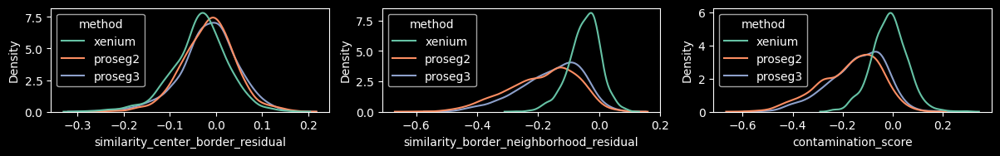

In [112]:
features = ["similarity_center_border_residual", "similarity_border_neighborhood_residual", "contamination_score"]
density_plot_feature(st_dict, features)

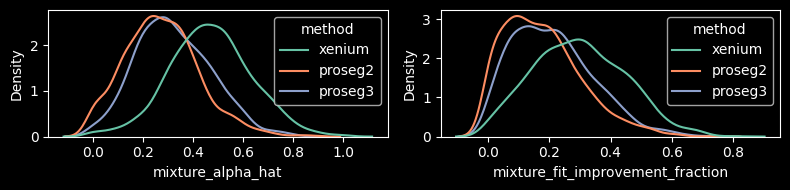

In [113]:
features = ["mixture_alpha_hat", "mixture_fit_improvement_fraction"]
density_plot_feature(st_dict, features)

In [114]:
sdata_xenium_ws = sd.read_zarr("../../data/xenium.zarr")
sdata_bidcell_ws = sd.read_zarr("../../data/bidcell.zarr")
sdata_proseg_ws = sd.read_zarr("../../data/proseg2.zarr")

no parent found for <ome_zarr.reader.Label object at 0x7ffd44543a90>: None
no parent found for <ome_zarr.reader.Label object at 0x7ffe08a39650>: None
no parent found for <ome_zarr.reader.Label object at 0x7ffd44d76690>: None
no parent found for <ome_zarr.reader.Label object at 0x7ffd4457c390>: None
no parent found for <ome_zarr.reader.Label object at 0x7ffd44d68290>: None
no parent found for <ome_zarr.reader.Label object at 0x7ffd44d91ad0>: None
no parent found for <ome_zarr.reader.Label object at 0x7ffd41ec18d0>: None
no parent found for <ome_zarr.reader.Label object at 0x7ffd41ec0e50>: None
no parent found for <ome_zarr.reader.Label object at 0x7ffd41e23d90>: None
no parent found for <ome_zarr.reader.Label object at 0x7ffd41e08910>: None


In [115]:
bb_xmin = 800
bb_ymin = 1150
bb_w = 200
bb_h = 300
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

In [116]:
def crop(ws):
    return ws.query.bounding_box(
        axes=["x", "y"],
        min_coordinate=[bb_xmin, bb_ymin],
        max_coordinate=[bb_xmax, bb_ymax],
        target_coordinate_system="global",
    )


sdata_xenium = crop(sdata_xenium_ws)
sdata_bidcell = crop(sdata_bidcell_ws)
sdata_proseg = crop(sdata_proseg_ws)

/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: UserWarning: The object has `points` element. Depending on the number of points, querying MAY suffer from performance issues. Please consider filtering the object before calling this function by calling the `subset()` method of `SpatialData`.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: UserWarning: The object has `points` element. Depending on the number of points, querying MAY suffer from performance issues. Please consider filtering the object before calling this function by calling the `subset()` method of `SpatialData`.
  return dispatch(args[0].__class__)(*args, **kw)
/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: UserWarning: The object has `points` element. Depending on the number of points, querying MAY suffer from perfo

In [117]:
st_xenium = segtraq.SegTraQ(
    sdata_xenium, images_key="image", tables_centroid_x_key="x_centroid", tables_centroid_y_key="y_centroid"
)
st_bidcell = segtraq.SegTraQ(
    sdata_bidcell,
    images_key="image",
    points_background_id=0,
    tables_centroid_x_key="centroid_x",
    tables_centroid_y_key="centroid_y",
)
st_proseg = segtraq.SegTraQ(
    sdata_proseg,
    images_key="image",
    points_background_id=0,
    tables_area_key=None,
    tables_centroid_x_key="centroid_x",
    tables_centroid_y_key="centroid_y",
)

/g/huber/users/lazic/src/SegTraQ/src/segtraq/utils.py:1334: UserWarning: Duplicate IDs detected in index 'cell_id' for shapes 'nucleus_boundaries'. Resetting and renaming index to `segtraq_id` to ensure uniqueness.
  nucleus_shapes = _ensure_index(
/g/huber/users/lazic/src/SegTraQ/src/segtraq/utils.py:1334: UserWarning: Duplicate IDs detected in index 'cell_id' for shapes 'nucleus_boundaries'. Resetting and renaming index to `segtraq_id` to ensure uniqueness.
  nucleus_shapes = _ensure_index(
/g/huber/users/lazic/src/SegTraQ/src/segtraq/SegTraQ.py:116: RuntimeWarning: No area column specified for tables. Area will be automatically computed from shapes.
  validate_spatialdata(


In [118]:
st_dict = {"xenium": st_xenium, "bidcell": st_bidcell, "proseg": st_proseg}

In [119]:
for _, st in st_dict.items():
    st.filter_control_and_low_quality_transcripts(min_qv=20)

/g/huber/users/lazic/src/SegTraQ/src/segtraq/SegTraQ.py:871: RuntimeWarning: Some of the filtered genes (3301) also appear in the tables. These genes are: ['RCC1', 'TOLLIP', 'RBM27', 'ELK4', 'CCDC102B']... If you wish to recompute the expression matrix after filtering, set recompute_expression=True.
  _filter_control_and_low_quality_transcripts(


In [120]:
for method, st in st_dict.items():

    _cos_sim = st.rs.null_corrected_center_border_similarity(n_sim=50)
    _mix_fit = st.rs.mixture_fit_contamination_score()

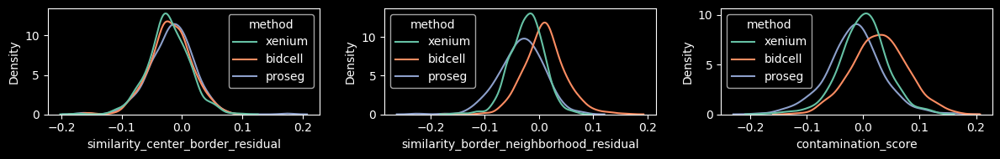

In [122]:
features = ["similarity_center_border_residual", "similarity_border_neighborhood_residual", "contamination_score"]
density_plot_feature(st_dict, features)

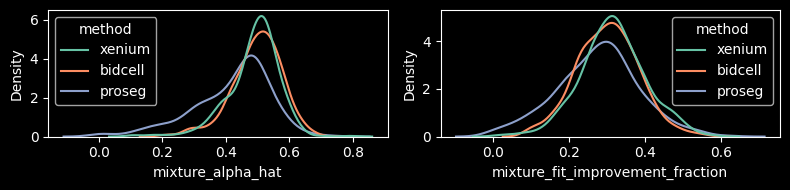

In [123]:
features = ["mixture_alpha_hat", "mixture_fit_improvement_fraction"]
density_plot_feature(st_dict, features)